#E-commerce analysis





## 1-Importing Necessary Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

##2-Data Understanding

In [ ]:
df1=pd.read_csv('/content/ecommerce_customer_data_large.csv')
df1.head()

,Customer ID,Purchase Date,Product Category,Product Price,Quantity,Total Purchase Amount,Payment Method,Customer Age,Returns,Customer Name,Age,Gender,Churn
0,44605,2023-05-03 21:30:02,Home,177,1,2427,PayPal,31,1.0,John Rivera,31,Female,0
1,44605,2021-05-16 13:57:44,Electronics,174,3,2448,PayPal,31,1.0,John Rivera,31,Female,0
2,44605,2020-07-13 06:16:57,Books,413,1,2345,Credit Card,31,1.0,John Rivera,31,Female,0
3,44605,2023-01-17 13:14:36,Electronics,396,3,937,Cash,31,0.0,John Rivera,31,Female,0
4,44605,2021-05-01 11:29:27,Books,259,4,2598,PayPal,31,1.0,John Rivera,31,Female,0


In [ ]:

df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250000 entries, 0 to 249999
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Customer ID            250000 non-null  int64  
 1   Purchase Date          250000 non-null  object 
 2   Product Category       250000 non-null  object 
 3   Product Price          250000 non-null  int64  
 4   Quantity               250000 non-null  int64  
 5   Total Purchase Amount  250000 non-null  int64  
 6   Payment Method         250000 non-null  object 
 7   Customer Age           250000 non-null  int64  
 8   Returns                202618 non-null  float64
 9   Customer Name          250000 non-null  object 
 10  Age                    250000 non-null  int64  
 11  Gender                 250000 non-null  object 
 12  Churn                  250000 non-null  int64  
dtypes: float64(1), int64(7), object(5)
memory usage: 24.8+ MB


In [ ]:
categorical_columns=list(df1.select_dtypes(include='object').columns)
numerical_columns=list(df1.select_dtypes(include=['float64','int64']).columns)
bool_columns=list(df1.select_dtypes(include='bool').columns)
print(f"There are {len(categorical_columns)} Categorical columns: {categorical_columns}")
print(f"There are {len(numerical_columns)} Numerical columns: {numerical_columns}")
print(f"Total number of columns :{len(numerical_columns)+len(categorical_columns)}")


There are 5 Categorical columns: ['Purchase Date', 'Product Category', 'Payment Method', 'Customer Name', 'Gender']
There are 8 Numerical columns: ['Customer ID', 'Product Price', 'Quantity', 'Total Purchase Amount', 'Customer Age', 'Returns', 'Age', 'Churn']
Total number of columns :13


## 3-Data Cleaning & Preparation

In [ ]:
 #Missing Values
missing_values = df1.isnull().sum()
missing_percentage = (missing_values / len(df1)) * 100
print('missing_values')
print(missing_values)

print("*"*20)
print("missing_percentage")

print(missing_percentage)

missing_values
Customer ID                  0
Purchase Date                0
Product Category             0
Product Price                0
Quantity                     0
Total Purchase Amount        0
Payment Method               0
Customer Age                 0
Returns                  47382
Customer Name                0
Age                          0
Gender                       0
Churn                        0
dtype: int64
********************
missing_percentage
Customer ID               0.0000
Purchase Date             0.0000
Product Category          0.0000
Product Price             0.0000
Quantity                  0.0000
Total Purchase Amount     0.0000
Payment Method            0.0000
Customer Age              0.0000
Returns                  18.9528
Customer Name             0.0000
Age                       0.0000
Gender                    0.0000
Churn                     0.0000
dtype: float64


#### - Remove duplicates and standardize column naming ( resolve duplicate Age vs Customer Age)

 Remov column customer Age.

In [ ]:
df1.drop(columns='Customer Name',inplace=True)
df1.drop('Customer Age', axis=1, inplace=True)

#### - Handle missing values in the Returns column

I going to replaces all NaN (missing) values in that column with 0,Returns column(47382 row)

In [ ]:
df1['Returns'].fillna(0, inplace=True)

<ipython-input-8-66ace08ba2ce>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df1['Returns'].fillna(0, inplace=True)


- Convert Purchase Date to datetime format and extract year/month/day

In [ ]:
df1['Purchase Date'] = pd.to_datetime(df1['Purchase Date'])
df1['Year'] = df1['Purchase Date'].dt.year
df1['Month'] = df1['Purchase Date'].dt.month
df1['Day'] = df1['Purchase Date'].dt.day


In [ ]:
df1[['Churn','Returns']].astype(bool)

,Churn,Returns
0,False,True
1,False,True
2,False,True
3,False,False
4,False,True
...,...,...
249995,False,False
249996,False,True
249997,False,False
249998,False,True


In [ ]:
unique_values=df1['Payment Method'].nunique()
unique_values

3

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250000 entries, 0 to 249999
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   Customer ID            250000 non-null  int64         
 1   Purchase Date          250000 non-null  datetime64[ns]
 2   Product Category       250000 non-null  object        
 3   Product Price          250000 non-null  int64         
 4   Quantity               250000 non-null  int64         
 5   Total Purchase Amount  250000 non-null  int64         
 6   Payment Method         250000 non-null  object        
 7   Returns                250000 non-null  float64       
 8   Age                    250000 non-null  int64         
 9   Gender                 250000 non-null  object        
 10  Churn                  250000 non-null  int64         
 11  Year                   250000 non-null  int32         
 12  Month                  250000 non-null  int3

In [ ]:
#Check for duplicate values:
df1.duplicated().sum()

np.int64(0)

In [ ]:
numerical_columns=list(df1.select_dtypes(include=['float64','int64']).columns)
#check autlier in char
for col in numerical_columns:
    fig = px.box(df1, y=col, points="outliers", title=f"Boxplot of {col} with Outliers Highlighted")
    fig.show()

Descriptive Statistics for Numerical Columns

In [ ]:
df1.describe()

,Customer ID,Purchase Date,Product Price,Quantity,Total Purchase Amount,Returns,Age,Churn,Year,Month,Day
count,250000.000000,250000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.00000,250000.000000,250000.000000,250000.000000
mean,25017.632092,2021-11-06 19:26:22.286192384,254.742724,3.004936,2725.385196,0.405904,43.798276,0.20052,2021.377136,6.190376,15.654804
min,1.000000,2020-01-01 00:07:26,10.000000,1.000000,100.000000,0.000000,18.000000,0.00000,2020.000000,1.000000,1.000000
25%,12590.000000,2020-12-03 08:10:12,132.000000,2.000000,1476.000000,0.000000,30.000000,0.00000,2020.000000,3.000000,8.000000
50%,25011.000000,2021-11-06 07:39:08.500000,255.000000,3.000000,2725.000000,0.000000,44.000000,0.00000,2021.000000,6.000000,16.000000
75%,37441.250000,2022-10-11 01:21:56.249999872,377.000000,4.000000,3975.000000,1.000000,57.000000,0.00000,2022.000000,9.000000,23.000000
max,50000.000000,2023-09-13 18:42:49,500.000000,5.000000,5350.000000,1.000000,70.000000,1.00000,2023.000000,12.000000,31.000000
std,14412.515718,NaN,141.738104,1.414737,1442.576095,0.491067,15.364915,0.40039,1.074712,3.353238,8.806431


Descriptive Statistics for Categorical Columns

In [ ]:
df1.describe(include='object')

,Product Category,Payment Method,Gender
count,250000,250000,250000
unique,4,3,2
top,Electronics,Credit Card,Male
freq,62630,83547,125676


#4- EDA

## 1/4- Customer Demographics Analysis

- Distribution of customers by:
     *   Age groups ( <20, 20–30, 30–40, etc.)
     *  Gender

<ipython-input-17-bf8a2310ea0b>:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Customer Distribution by Age Group and Gender:


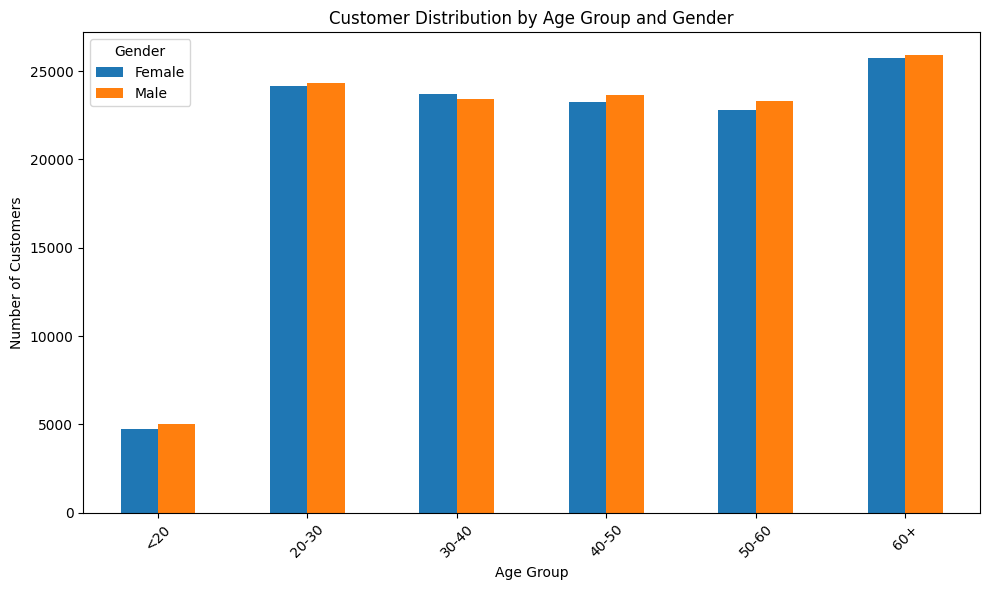

In [ ]:

# Distribution of customers by Age groups and Gender
age_bins = [0, 20, 30, 40, 50, 60, 100]
age_labels = ['<20', '20-30', '30-40', '40-50', '50-60', '60+']
df1['Age Group'] = pd.cut(df1['Age'], bins=age_bins, labels=age_labels, right=False)

# Group by Age Group and Gender and count customers
customer_distribution = df1.groupby(['Age Group', 'Gender']).size().unstack(fill_value=0)

print("Customer Distribution by Age Group and Gender:")
customer_distribution

# Visualize the distribution+
customer_distribution.plot(kind='bar', figsize=(10, 6))
plt.title('Customer Distribution by Age Group and Gender')
plt.xlabel('Age Group')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)
plt.legend(title='Gender')
plt.tight_layout()
plt.show()

*  Average spending by age group and gender





In [ ]:
Average_spending = df1.groupby(['Age Group', 'Gender'])['Total Purchase Amount'].mean()
print("Average spending by age group and gender:")
Average_spending
# Visualize

Average_spending_df = Average_spending.reset_index()
fig = px.bar(
    Average_spending_df,
    x='Age Group',
    y='Total Purchase Amount',
    color='Gender',
    barmode='group',
    title='Average Spending by Age Group and Gender'
)
fig.show()


NameError: name 'df1' is not defined

● Preferred payment methods across demographics





In [ ]:
Preferred_payment_methods=df1.groupby(['Age Group', 'Gender', 'Payment Method']).count().reset_index()
print("Preferred payment methods across demographics:")
Preferred_payment_methods
fig=px.histogram(Preferred_payment_methods, x='Payment Method', color='Gender', barmode='group',
                 title='Preferred Payment Methods Across Demographics')
fig.show()


<ipython-input-19-0b3b6446c5c3>:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Preferred payment methods across demographics:


# 2.4- Sales Performance Analysis

### ● Total sales and number of purchases over time (monthly/quarterly/yearly)

In [ ]:
total_sales_monthly = df1.groupby(pd.Grouper(key='Purchase Date', freq='M'))['Total Purchase Amount'].sum()
print('total_sales_monthly')
total_sales_quarterly = df1.groupby(pd.Grouper(key='Purchase Date', freq='Q'))['Total Purchase Amount'].sum()
print('total_sales_quarterly')
total_sale_yearly = df1.groupby(pd.Grouper(key='Purchase Date', freq='Y'))['Total Purchase Amount'].sum()
print('total_sale_yearly')
fig3=px.line(total_sales_monthly, x=total_sales_monthly.index, y=total_sales_monthly.values, title='Total Sales over Time (Monthly)')
fig4=px.line(total_sales_quarterly, x=total_sales_quarterly.index, y=total_sales_quarterly.values, title='Total Sales over Time (Quarterly)')
fig5=px.line(total_sale_yearly, x=total_sale_yearly.index, y=total_sale_yearly.values, title='Total Sales over Time (Yearly)')
fig_x=make_subplots(rows=1, cols=3,
                    subplot_titles=['Total Sales over Time (Monthly)', 'Total Sales over Time (Quarterly)', 'Total Sales over Time (Yearly)'],
                   )
fig_x.add_trace(fig3.data[0], row=1, col=1)
fig_x.add_trace(fig4.data[0], row=1, col=2)
fig_x.add_trace(fig5.data[0], row=1, col=3)
fig_x.add_trace(fig4.data[0], row=1, col=2)
fig_x.add_trace(fig5.data[0], row=1, col=3)

<ipython-input-20-e8279ff354d5>:1: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



total_sales_monthly
total_sales_quarterly


<ipython-input-20-e8279ff354d5>:3: FutureWarning:

'Q' is deprecated and will be removed in a future version, please use 'QE' instead.

<ipython-input-20-e8279ff354d5>:5: FutureWarning:

'Y' is deprecated and will be removed in a future version, please use 'YE' instead.



total_sale_yearly


● Sales by product category  over time (monthly/quarterly/yearly)

In [ ]:
sales_category_quarterly = df1.groupby([pd.Grouper(key='Purchase Date', freq='Q'), 'Product Category'])['Total Purchase Amount'].sum().reset_index()
print("Sales by Product Category over time (quarterly):")
sales_category_quarterly
fig6= px.line(
    sales_category_quarterly,
    x='Purchase Date',
    y='Total Purchase Amount',
    color='Product Category',
    title='Sales by Product Category over time (quarterly)'
)
fig6.show()

<ipython-input-21-aca9b4bde333>:1: FutureWarning:

'Q' is deprecated and will be removed in a future version, please use 'QE' instead.



Sales by Product Category over time (quarterly):


In [ ]:
sales_category_yearly = df1.groupby([pd.Grouper(key='Purchase Date', freq='Y'), 'Product Category'])['Total Purchase Amount'].sum().reset_index()
print("Sales by Product Category over time (yearly):")
sales_category_yearly
fig7= px.line(
    sales_category_yearly,
    x='Purchase Date',
    y='Total Purchase Amount',
    color='Product Category',
    title='Sales by Product Category over time (yearly)'
)


<ipython-input-22-0e9220622a4b>:1: FutureWarning:

'Y' is deprecated and will be removed in a future version, please use 'YE' instead.



Sales by Product Category over time (yearly):


In [ ]:
fig_y=make_subplots(rows=1, cols=2,
                    subplot_titles=['Sales by Product Category over time (quarterly)', 'Sales by Product Category over time (yearly)'])
for trace in fig6.data:
  fig_y.add_trace(trace, row=1, col=1)
for trace in fig7.data:
  fig_y.add_trace(trace, row=1, col=2)
fig_y

**●** Average order value and quantity per transaction


In [ ]:
 #Calculate average order value per transaction
average_order_value = df1.groupby('Customer ID')['Total Purchase Amount'].mean().mean()
# Calculate average order value per transaction
average_order_value = df1.groupby('Customer ID')['Total Purchase Amount'].mean().mean()
print(f"Average Order Value per Transaction: {average_order_value:.2f}")

# Calculate average quantity per transaction
average_quantity_per_transaction = df1.groupby('Customer ID')['Quantity'].count().mean()
print(f"Average Quantity per Transaction: {average_quantity_per_transaction:.2f}")


Average Order Value per Transaction: 2727.09
Average Quantity per Transaction: 5.03


### top categories revenue

In [ ]:
top_categories_revenue = df1.groupby('Product Category')['Total Purchase Amount'].sum()
print("Top Categories by Revenue:")
print(top_categories_revenue)
fig=px.pie(top_categories_revenue, values=top_categories_revenue.values, names=top_categories_revenue.index,
             title='Top Categories by Revenue')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

Top Categories by Revenue:
Product Category
Books          169345236
Clothing       170716122
Electronics    170146025
Home           171138916
Name: Total Purchase Amount, dtype: int64


In [ ]:
top_categories_revenue_quarterly = df1.groupby([pd.Grouper(key='Purchase Date', freq='Q'), 'Product Category'])['Total Purchase Amount'].sum().reset_index()
print("Top Categories by Revenue (quarterly):")
top_categories_revenue_quarterly
fig8=px.bar(top_categories_revenue_quarterly,x='Purchase Date', y='Total Purchase Amount', color='Product Category', title='Top Categories by Revenue (quarterly)', barmode='group')
fig8.show()

<ipython-input-26-e9c5073ba466>:1: FutureWarning:

'Q' is deprecated and will be removed in a future version, please use 'QE' instead.



Top Categories by Revenue (quarterly):


In [ ]:
top_categories_revenue_yearly = df1.groupby([pd.Grouper(key='Purchase Date', freq='Y'), 'Product Category'])['Total Purchase Amount'].sum().reset_index()
print("Top Categories by Revenue (yearly):")
top_categories_revenue_yearly
fig9=px.bar(top_categories_revenue_yearly,x='Purchase Date', y='Total Purchase Amount', barmode='group', color='Product Category', title='Top Categories by Revenue (yearly)')
fig9.show()

<ipython-input-27-68c6031cc9ae>:1: FutureWarning:

'Y' is deprecated and will be removed in a future version, please use 'YE' instead.



Top Categories by Revenue (yearly):


3.4- Return Behavior Analysis

Return rate overall and by:
* ○ Product category
* ○ Customer segment (age/gender)  
* ○ Payment method

In [ ]:
# Overall Return Rate
overall_return_rate = (df1['Returns'].sum() / len(df1)) * 100
print(f"Overall Return Rate: {overall_return_rate:.2f}%")

# Return Rate by Product Category
return_rate_by_category = df1.groupby('Product Category')['Returns'].mean()* 100
print("\nReturn Rate by Product Category:")
return_rate_by_category


Overall Return Rate: 40.59%

Return Rate by Product Category:


,Returns
Product Category,
Books,40.814818
Clothing,40.430802
Electronics,40.632285
Home,40.484794


In [ ]:
 df1.columns

Index(['Customer ID', 'Purchase Date', 'Product Category', 'Product Price',
       'Quantity', 'Total Purchase Amount', 'Payment Method', 'Returns', 'Age',
       'Gender', 'Churn', 'Year', 'Month', 'Day', 'Age Group'],
      dtype='object')

In [ ]:
# Return Rate by Customer segment (age/gender)
return_rate_by_segment = df1.groupby(['Age Group', 'Gender'])['Returns'].mean()
print("\nReturn Rate by Customer segment (age/gender):")
return_rate_by_segment_df = return_rate_by_segment.reset_index()
fig = px.bar(
    return_rate_by_segment_df,
    x='Age Group',
    y='Returns',
    color='Gender',
    barmode='group',
    title='Return Rate by Customer segment (age/gender)'
)
fig.show()



Return Rate by Customer segment (age/gender):


<ipython-input-30-1e665831e5d6>:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [ ]:
# Return Rate by Payment method
return_rate_by_Payment_method=df1.groupby('Payment Method')['Returns'].mean()*100
print("\nReturn Rate by Payment_method:")
return_rate_by_Payment_method
fig = px.bar(
    return_rate_by_Payment_method,
    x=return_rate_by_Payment_method.index,
    y=return_rate_by_Payment_method.values,
    title='Return Rate by Payment Method'
)
fig.show()


Return Rate by Payment_method:


In [ ]:

# Calculate total revenue
total_revenue = df1['Total Purchase Amount'].sum()

# Calculate total revenue from returned items (assuming 'Total Purchase Amount' is the value of the item)
# We are assuming that 'Returns' is a binary column (1 for returned, 0 for not returned)
returned_revenue = (df1['Total Purchase Amount'] * df1['Returns']).sum()

# Calculate percentage of lost revenue due to returns
percentage_lost_revenue = (returned_revenue / total_revenue) * 100

print(f"Percentage of Lost Revenue due to Returns: {percentage_lost_revenue:.2f}%")


Percentage of Lost Revenue due to Returns: 40.62%


# 6. Customer Purchase Behavior

In [ ]:
# Frequency of purchases per customer
purchase_frequency = df1.groupby('Customer ID').size().reset_index(name='Purchase Count')
fig = px.histogram(purchase_frequency, x='Purchase Count', title='Frequency of Purchases per Customer')
fig.update_layout(bargap=0.1)
fig.show()

In [ ]:
#Repeat vs one-time customers
repeat_customers = purchase_frequency[purchase_frequency > 1].count()
one_time_customers = purchase_frequency[purchase_frequency == 1].count()
print(f"Number of Repeat Customers: {repeat_customers}")
print(f"Number of One-Time Customers: {one_time_customers}")


Number of Repeat Customers: Customer ID       49660
Purchase Count    48008
dtype: int64
Number of One-Time Customers: Customer ID          1
Purchase Count    1653
dtype: int64


In [ ]:
#Average revenue per customer
average_revenue_per_customer = df1.groupby('Customer ID')['Total Purchase Amount'].mean()
print("Average Revenue per Customer:")

# Visualize the average revenue per customer
fig = px.histogram(average_revenue_per_customer, x=average_revenue_per_customer.values,
                   title='Distribution of Average Revenue per Customer',
                   labels={'x': 'Average Revenue per Customer', 'y': 'Number of Customers'})
fig.show()

Average Revenue per Customer:


In [ ]:
#Popular product categories among frequent buyers
frequent_buyer_ids = purchase_frequency[purchase_frequency['Purchase Count'] > 1]['Customer ID']
frequent_buyer_df = df1[df1['Customer ID'].isin(frequent_buyer_ids)]
popular_categories = frequent_buyer_df['Product Category'].value_counts()
print("Popular Product Categories among Frequent Buyers:")
print(popular_categories)
fig = px.bar(popular_categories, x=popular_categories.index, y=popular_categories.values,
             title='Popular Product Categories among Frequent Buyers')
fig.update_layout(xaxis_title='Product Category', yaxis_title='Number of Purchases')
fig.show()


Popular Product Categories among Frequent Buyers:
Product Category
Electronics    62220
Clothing       62174
Home           62104
Books          61849
Name: count, dtype: int64


## 7. Payment Method Trends

In [ ]:
# Analyze the usage breakdown of payment methods
payment_method_counts = df1['Payment Method'].value_counts()
print("Usage breakdown of payment methods:")
print(payment_method_counts)

# Visualize the breakdown
fig = px.pie(payment_method_counts, values=payment_method_counts.values, names=payment_method_counts.index,
             title='Breakdown of Payment Methods Usage')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

# Payment method usage over time (quarterly)
payment_method_time = df1.groupby([pd.Grouper(key='Purchase Date', freq='Q'), 'Payment Method']).size().unstack(fill_value=0)
print("\nPayment method usage over time (quarterly):")


# Visualize payment method usage over time
fig = px.line(payment_method_time, title='Payment Method Usage Over Time (quarterly)')
fig.update_layout(xaxis_title='Date', yaxis_title='Number of Transactions')
fig.show()


Usage breakdown of payment methods:
Payment Method
Credit Card    83547
PayPal         83441
Cash           83012
Name: count, dtype: int64


<ipython-input-64-4682a8a50590>:13: FutureWarning:

'Q' is deprecated and will be removed in a future version, please use 'QE' instead.




Payment method usage over time (quarterly):


In [ ]:
# Average transaction amount by payment method
average_transaction_by_payment = df1.groupby('Payment Method')['Total Purchase Amount'].mean()
print("\nAverage transaction amount by payment method:")
print(average_transaction_by_payment)

# Visualize the average transaction amount by payment method
fig = px.pie(average_transaction_by_payment, values=average_transaction_by_payment.values, names=average_transaction_by_payment.index,
             title='Average Transaction Amount by Payment Method')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()


print("\nReturn Rate by Payment_method:")
return_rate_by_Payment_method


Average transaction amount by payment method:
Payment Method
Cash           2715.557437
Credit Card    2738.852562
PayPal         2721.677952
Name: Total Purchase Amount, dtype: float64



Return Rate by Payment_method:


,Returns
Payment Method,
Cash,0.405797
Credit Card,0.405257
PayPal,0.406659


#M L model

In [ ]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
! pip install datasist
from datasist.structdata import detect_outliers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 43.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.1/69.1 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.9/386.9 kB 24.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.5/133.5 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.7/59.7 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 63.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 3.8 MB/s eta 0:00:00
  Attempting uninstall: jupyter-client
    Found existing installation: jupyter-client 6.1.12
    Uninstalling jupyter-client-6.1.12:
      Successfully uninstalled jupyter-client-6.1.12
  Attempting uninstall: jupyter-server
    Found existing installation: jupyter-server 1.16.0
    Uninstalling jupyter-server-1.16.0:
      Successfully uninstalled jupyter-server-1.16.0


In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


In [ ]:
print("Columns:", df1.columns)
print(df1.describe())
 # Detect outliers using datasist
outlier_dict ={}
print(outlier_dict)

Columns: Index(['Customer ID', 'Purchase Date', 'Product Category', 'Product Price',
       'Quantity', 'Total Purchase Amount', 'Payment Method', 'Returns', 'Age',
       'Gender', 'Churn', 'Year', 'Month', 'Day', 'Age Group'],
      dtype='object')
         Customer ID                  Purchase Date  Product Price  \
count  250000.000000                         250000  250000.000000   
mean    25017.632092  2021-11-06 19:26:22.286192384     254.742724   
min         1.000000            2020-01-01 00:07:26      10.000000   
25%     12590.000000            2020-12-03 08:10:12     132.000000   
50%     25011.000000     2021-11-06 07:39:08.500000     255.000000   
75%     37441.250000  2022-10-11 01:21:56.249999872     377.000000   
max     50000.000000            2023-09-13 18:42:49     500.000000   
std     14412.515718                            NaN     141.738104   

            Quantity  Total Purchase Amount        Returns            Age  \
count  250000.000000          250000.0000

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250000 entries, 0 to 249999
Data columns (total 15 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   Customer ID            250000 non-null  int64         
 1   Purchase Date          250000 non-null  datetime64[ns]
 2   Product Category       250000 non-null  object        
 3   Product Price          250000 non-null  int64         
 4   Quantity               250000 non-null  int64         
 5   Total Purchase Amount  250000 non-null  int64         
 6   Payment Method         250000 non-null  object        
 7   Returns                250000 non-null  float64       
 8   Age                    250000 non-null  int64         
 9   Gender                 250000 non-null  object        
 10  Churn                  250000 non-null  int64         
 11  Year                   250000 non-null  int32         
 12  Month                  250000 non-null  int3

In [ ]:
# View outlier summary
# Step 2: Visualize outliers for a selected numeric column
for y in numerical_columns:
  fig = px.box(df1, y=y, points="outliers", title=f"Boxplot of {y} with Outliers Highlighted")
  fig.show()



In [ ]:
df = pd.read_csv('ecommerce_customer_data_large.csv')
df.head()

,Customer ID,Purchase Date,Product Category,Product Price,Quantity,Total Purchase Amount,Payment Method,Customer Age,Returns,Customer Name,Age,Gender,Churn
0,44605,2023-05-03 21:30:02,Home,177,1,2427,PayPal,31,1.0,John Rivera,31,Female,0
1,44605,2021-05-16 13:57:44,Electronics,174,3,2448,PayPal,31,1.0,John Rivera,31,Female,0
2,44605,2020-07-13 06:16:57,Books,413,1,2345,Credit Card,31,1.0,John Rivera,31,Female,0
3,44605,2023-01-17 13:14:36,Electronics,396,3,937,Cash,31,0.0,John Rivera,31,Female,0
4,44605,2021-05-01 11:29:27,Books,259,4,2598,PayPal,31,1.0,John Rivera,31,Female,0


In [ ]:
# Data cleaning
# Remove duplicate age column and irrelevant identifiers
df = df.drop(['Customer ID', 'Customer Name', 'Age'], axis=1)


In [ ]:
# Convert Purchase Date to datetime and extract useful features
df['Purchase Date'] = pd.to_datetime(df['Purchase Date'])
df['Purchase Year'] = df['Purchase Date'].dt.year
df['Purchase Month'] = df['Purchase Date'].dt.month
df['Purchase Day'] = df['Purchase Date'].dt.day
df['Purchase DayOfWeek'] = df['Purchase Date'].dt.dayofweek
df = df.drop('Purchase Date', axis=1)

In [ ]:
# Separate features and target
X = df.drop('Churn', axis=1)
y = df['Churn']


In [ ]:
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [ ]:
# Define preprocessing for numeric and categorical columns
numeric_features = ['Product Price', 'Quantity', 'Total Purchase Amount', 'Customer Age',
                    'Purchase Year', 'Purchase Month', 'Purchase Day', 'Purchase DayOfWeek']
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

categorical_features = ['Product Category', 'Payment Method', 'Gender']
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])
# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

# Create preprocessing and classification pipeline
model = Pipeline(steps=[('preprocessor', preprocessor),
                        ('classifier', RandomForestClassifier(random_state=42))])


In [ ]:
# Train the model
model.fit(X_train, y_train)

# Predict on test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Model Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Model Accuracy: 0.79922

Classification Report:
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     39974
           1       0.16      0.00      0.00     10026

    accuracy                           0.80     50000
   macro avg       0.48      0.50      0.44     50000
weighted avg       0.67      0.80      0.71     50000


Confusion Matrix:
[[39958    16]
 [10023     3]]


In [ ]:



# ##Churn Prediction
#
# Using the Random Forest model trained in the preceding code, predict churn probability for the test set.
# Then visualize the distribution of predicted churn probabilities for both actual churned and non-churned customers.

# Predict churn probabilities on the test set
y_pred_proba = model.predict_proba(X_test)[:, 1]  # Probability of the positive class (churn=1)
print('y_pred_proba')
# Create a DataFrame to visualize the distribution of predicted probabilities
prob_df = pd.DataFrame({'Actual Churn': y_test, 'Predicted Churn Probability': y_pred_proba})
print('prob_df ')
# Visualize the distribution of predicted probabilities for each class
fig = px.histogram(
    prob_df,
    x='Predicted Churn Probability',
    color='Actual Churn',
    nbins=50,  # Adjust number of bins for better visualization
    title='Distribution of Predicted Churn Probabilities by Actual Churn Status',
    labels={'Predicted Churn Probability': 'Predicted Probability of Churn'}
)
fig.update_layout(bargap=0.1)
fig.show()


y_pred_proba
prob_df 
